In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
%matplotlib inline

from pathlib import Path
import numpy as np
import pandas as pd
import collections
import cv2
import pickle
import scipy

import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import seaborn as sns
sns.set_style("darkgrid")

import torch
import torchvision
from torchvision import transforms
import torchvision.models as models
from torch.utils.data.dataset import Dataset
from PIL import Image
import itertools
from IPython.display import display as disp
from IPython.display import Image as imgdisp

from annoy import AnnoyIndex

### Create subset of the IndoorCVPR_09 

In [3]:

# import os
# import shutil

# for root, dirs, files in os.walk(r'C:\Users\Aman\Documents\PS2_MapmyIndia\reverse-image-search-master\indoorCVPR_09'):
#     for file in itertools.islice((f for f in files if f.endswith(".jpg")),50):
#       path_file = os.path.join(root,file)
#       shutil.copy2(path_file,r'C:\Users\Aman\Documents\PS2_MapmyIndia\reverse-image-search-master\master_indoorCVPR_mini')


# Dataset Generation

In [4]:
def get_files_from_path(pathstring):
    """retrives file names from the folder and returns a pandas dataframe with
    two columns: path, filesize

    Arguments:
        pathstring {string} -- relative location of file

    Returns:
        [pandas dataframe] -- sorted by the filename
    """
    filenames = []
    for file in Path(pathstring).glob("**/*.jpg"):
        filenames.append((file, file.stat().st_size))
    files_df = pd.DataFrame(list(filenames), columns=["path", "filesize"])
    sorted_files = files_df.sort_values("path")
    result_df = sorted_files.reset_index(drop=True)
    return result_df

In [5]:
class ImageDataset(Dataset):
    """
    A custom dataset to provide a batch of Images for hashing.
    Images are normalized for Imagenet mean and sd. 
    Use the pandas dataframe get_file_df() for illustration purposes.
    """
    transform = None
    
    def __init__(self, path, img_size):
        self.df_files = get_files_from_path(path)
        self.transform = transforms.Compose([
            transforms.Resize(img_size, Image.ANTIALIAS),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406],
                                 [0.229, 0.224, 0.225]) ])
    
    def __getitem__(self, index):
        data = Image.open(self.df_files.iloc[index].path, 'r')
        data = data.convert('RGB')
        tensor = self.transform(data)
        return tensor,index
    
    def __len__(self):
        return self.df_files.shape[0]

    def get_file_df(self):
        return self.df_files

In [6]:
input_folder = r'C:\Users\Aman\Documents\PS2_MapmyIndia\CBIR_code\master_indoorCVPR_mini'
imgnet_size = (224,224)
inception_imgnet_size = (299,299)
input_dataset = ImageDataset(input_folder, img_size = imgnet_size)
pd_files = input_dataset.get_file_df()

cuda = torch.cuda.is_available()
bs = 100
kwargs = {'num_workers': 1, 'pin_memory': True} if cuda else {}
image_loader = torch.utils.data.DataLoader(input_dataset, batch_size=bs,**kwargs)

In [7]:
print(pd_files.shape)
pd_files.head()

(3286, 2)


,path,filesize
0,C:\Users\Aman\Documents\PS2_MapmyIndia\CBIR_co...,104179
1,C:\Users\Aman\Documents\PS2_MapmyIndia\CBIR_co...,78881
2,C:\Users\Aman\Documents\PS2_MapmyIndia\CBIR_co...,106476
3,C:\Users\Aman\Documents\PS2_MapmyIndia\CBIR_co...,149623
4,C:\Users\Aman\Documents\PS2_MapmyIndia\CBIR_co...,34706


# Plot Resulting Images

In [13]:
def build_montages(image_list, image_shape, montage_shape):

    if len(image_shape) != 2:
        raise Exception('image shape must be list or tuple of length 2 (rows, cols)')
    if len(montage_shape) != 2:
        raise Exception('montage shape must be list or tuple of length 2 (rows, cols)')
    image_montages = []
    # start with black canvas to draw images onto
    montage_image = np.zeros(shape=(image_shape[1] * (montage_shape[1]), image_shape[0] * montage_shape[0], 3),
                          dtype=np.uint8)
    cursor_pos = [0, 0]
    start_new_img = False
    for img in image_list:
        if type(img).__module__ != np.__name__:
            raise Exception('input of type {} is not a valid numpy array'.format(type(img)))
        start_new_img = False
        img = cv2.resize(img, image_shape)
        # draw image to black canvas
        montage_image[cursor_pos[1]:cursor_pos[1] + image_shape[1], cursor_pos[0]:cursor_pos[0] + image_shape[0]] = img
        cursor_pos[0] += image_shape[0]  # increment cursor x position
        if cursor_pos[0] >= montage_shape[0] * image_shape[0]:
            cursor_pos[1] += image_shape[1]  # increment cursor y position
            cursor_pos[0] = 0
            if cursor_pos[1] >= montage_shape[1] * image_shape[1]:
                cursor_pos = [0, 0]
                image_montages.append(montage_image)
                # reset black canvas
                montage_image = np.zeros(shape=(image_shape[1] * (montage_shape[1]), image_shape[0] * montage_shape[0], 3),
                                      dtype=np.uint8)
                start_new_img = True
    if start_new_img is False:
        image_montages.append(montage_image)  # add unfinished montage
    return image_montages

# Pre-trained Models

In [15]:
#load pre-trained models
alexnet = models.alexnet(pretrained=True)
vgg19 = models.vgg19(pretrained=True)
resnet152 = models.resnet152(pretrained=True)

models = [alexnet, vgg19, resnet152]

# Annoy Algorithm 

In [10]:
def getVectorIndex(model, image_loader):
    """ Core database creation function; uses Annoy to build a database
    of embedding for images from image_loader

    Arguments:
        model -- pre-trainned imagenet model to use. 
        
        image_loader -- pytorch image_loader

    Returns:
        [annoy index] -- can be used for querying
    """
    t = AnnoyIndex(1000, metric='euclidean')
    with torch.no_grad():
        model.eval()
        for batch_idx, (data, target) in enumerate(image_loader):
            outputs = model(data)
            for i in range(0, len(data)):
                t.add_item(target[i], outputs[i])
    t.build(20, n_jobs=-1)
    return t

In [11]:
def get_similar(item_no, annoyIndex):
    """ Query similar images based on index of existing 
    images in the database

    Arguments:
        item_no -- index of the image to be used for querying 
        
        annoyIndex -- pre-built Annoy Index

    Returns:
        get_nns_by_item - Returns indices
        get_nns_by_vector too can be used
        [indices] -- 5 nearest neighbor indices for query image
    """
    return annoyIndex.get_nns_by_item(item_no, 20, include_distances = False)

In [12]:
def get_similar_list(index, annoyIndexes, pd):
    """
    Returns indices of images similar to that of the query image
    """
    nn_output = [get_similar(index, annoyIndex) for annoyIndex in annoyIndexes]
    return nn_output

In [44]:
#generating annoy tree
annoy_indexes = [getVectorIndex(model, image_loader) for model in models]

In [46]:
"""
    random_idx -- index of the query image
    nn_outputs -- stores indices similar to that of query image
"""
random_idx = 2225
nn_outputs = get_similar_list(random_idx, annoy_indexes, pd_files)

In [47]:
print(nn_outputs)

[[2225, 1028, 1326, 1784, 1786, 1325, 811, 2218, 2274, 931, 1023, 1330, 2687, 62, 1058, 1109, 1798, 1779, 2354, 233], [2225, 1070, 2222, 789, 2069, 1109, 1798, 1799, 933, 469, 2218, 2224, 275, 467, 1077, 2071, 2217, 2078, 1326, 2088], [2225, 2232, 2078, 1798, 2088, 2222, 2230, 2069, 2223, 2228, 2217, 2157, 2070, 2071, 1688, 1109, 1055, 467, 1325, 216]]


In [48]:
def montage_disp(annoy_imgs, axis1, col):
    ax[axis,col].imshow(np.array(Image.open(pd_files.iloc[random_idx, 0])))
    montage = build_montages(annoy_imgs, (512,512), (5,4))[0]
    ax[axis,col+1].imshow(montage)

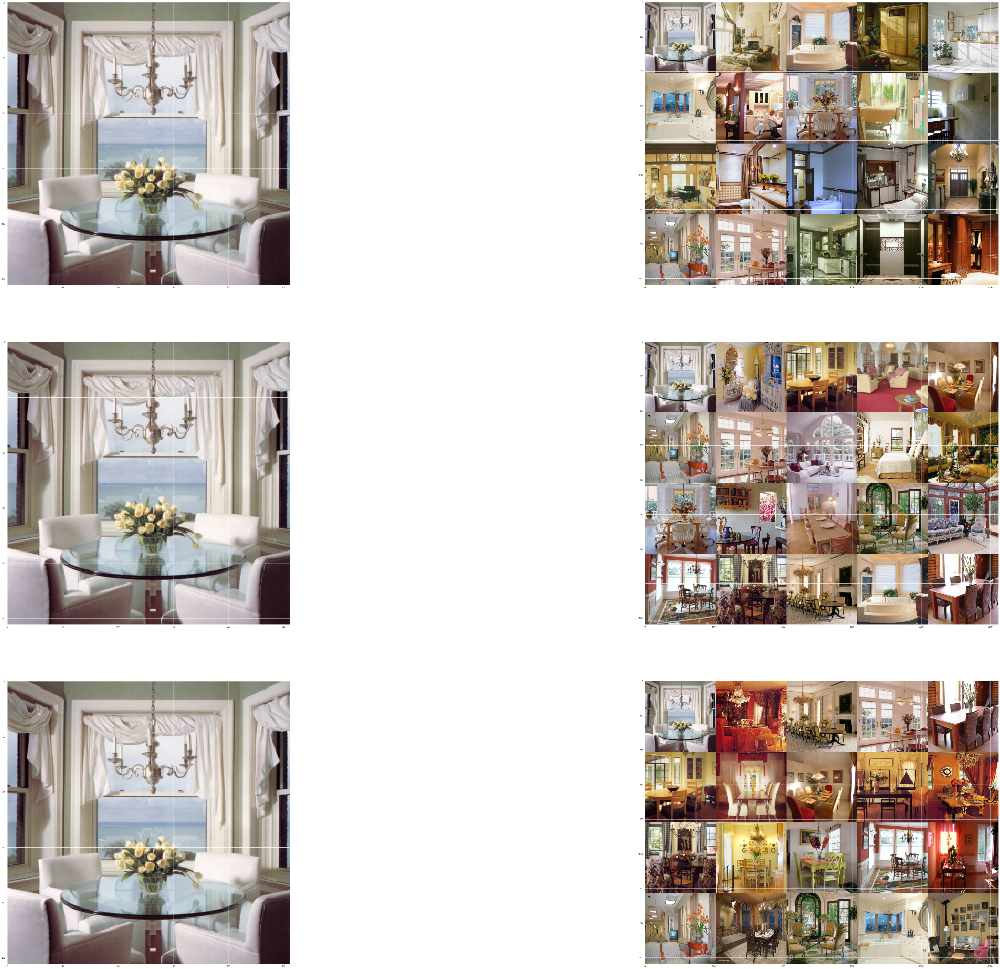

In [49]:
"""
    Plotting the resulting images in a grid similar to the query image
    Rows -- According to the sequence of the pre-trained models in the list models
    Row 1 - alexnet
    Row 2 - vgg19
    Row 3 - resnet152
"""
fig, ax = plt.subplots(nrows=3, ncols=2,figsize=(100,80))
axis = 0
j = 0
check = []
    
for row in range(0, len(nn_outputs)):
    annoy_imgs=[]
    for i in nn_outputs[row]:
        img = np.array(Image.open(pd_files.iloc[i, 0]))
        annoy_imgs.append(img)
        check.append(i)
    montage_disp(annoy_imgs, axis, 0)
    axis = axis+1     
        

## Dataset w/ Feature Extraction

In [17]:
#duplicating pd_files dataframe
new_data = pd_files.copy()
feature = []
index = []
feats_only = []

In [18]:
print(new_data.shape)
new_data.head()

(3286, 2)


,path,filesize
0,C:\Users\Aman\Documents\PS2_MapmyIndia\reverse...,104179
1,C:\Users\Aman\Documents\PS2_MapmyIndia\reverse...,78881
2,C:\Users\Aman\Documents\PS2_MapmyIndia\reverse...,106476
3,C:\Users\Aman\Documents\PS2_MapmyIndia\reverse...,149623
4,C:\Users\Aman\Documents\PS2_MapmyIndia\reverse...,34706


In [19]:
"""
    Feature Extraction
    y -- output feature vectors
    t -- indices
    feature -- storing indices and feature vectors into a dataframe
    index -- storing only the indices
    feats_only -- storing only the feature vectors
"""


with torch.no_grad():
    alexnet.eval()
    for batch_idx, (data, target) in enumerate(image_loader):
        output = alexnet(data)
        y = output.cpu().detach().numpy()
        t = target.cpu().detach().numpy()
        for i in range(0, len(data)):
            feature.append((t[i], y[i]))
            index.append(t[i])
            feats_only.append(y[i])
            

In [20]:
"""
    feature_df -- dataframe for indices + features
    feature_dict -- dictionary for indices+features
"""

feature_df = pd.DataFrame(list(feature), columns=["target", "feats"])
feature_dict = {'indexes':index, 'features':feats_only}

In [58]:
print(feature_df.shape)
feature_df.head()

(3286, 2)


,target,feats
0,0,"[-5.937301, -2.7975209, -2.749837, -3.2676058,..."
1,1,"[-3.6810427, -4.052502, -3.796631, -6.2912884,..."
2,2,"[-4.852584, 0.4521037, -2.1172497, -3.8046253,..."
3,3,"[-4.1911545, 0.63253564, -0.709555, -1.9213597..."
4,4,"[-6.0982995, -1.6761165, -1.1385015, -2.934539..."


In [23]:
"""
    data_feature_df -- joining feature_df (indices+features) 
                       with new_data (path of the image + filesize) 
                       into a single df
"""
data_feature_df = new_data.join(feature_df)
del data_feature_df['target']

In [24]:
print(data_feature_df.shape)
data_feature_df.head()

(3286, 3)


,path,filesize,feats
0,C:\Users\Aman\Documents\PS2_MapmyIndia\reverse...,104179,"[-5.937301, -2.7975209, -2.749837, -3.2676058,..."
1,C:\Users\Aman\Documents\PS2_MapmyIndia\reverse...,78881,"[-3.6810427, -4.052502, -3.796631, -6.2912884,..."
2,C:\Users\Aman\Documents\PS2_MapmyIndia\reverse...,106476,"[-4.852584, 0.4521037, -2.1172497, -3.8046253,..."
3,C:\Users\Aman\Documents\PS2_MapmyIndia\reverse...,149623,"[-4.1911545, 0.63253564, -0.709555, -1.9213597..."
4,C:\Users\Aman\Documents\PS2_MapmyIndia\reverse...,34706,"[-6.0982995, -1.6761165, -1.1385015, -2.934539..."


In [25]:
print(data_feature_df.loc[0, ['feats']])

feats    [-5.937301, -2.7975209, -2.749837, -3.2676058,...
Name: 0, dtype: object


# KNN self-implementation

In [26]:
def euclidean(a, b):
    return np.linalg.norm(a-b)

In [59]:
def cosine_distance(a,b):
    return scipy.spatial.distance.cosine(a, b)

In [27]:
"""
    maxResults -- no. of images to be retrieved (default=64)
    d -- distance calculated wrt to query image 
         using euclidean distance / cosine similarity
    results -- stores distance and the index of the image wrt query -- sorted
"""
def perform_search(queryFeatures, index, maxResults=64):
    results = []
    
    for i in range(0, len(index["features"])):
        d = euclidean(queryFeatures, index["features"][i] )
        results.append((d, i))
        
    results = sorted(results)[:maxResults]
    return results

734
3199
496
418
113
477
2112
2119
2300
506


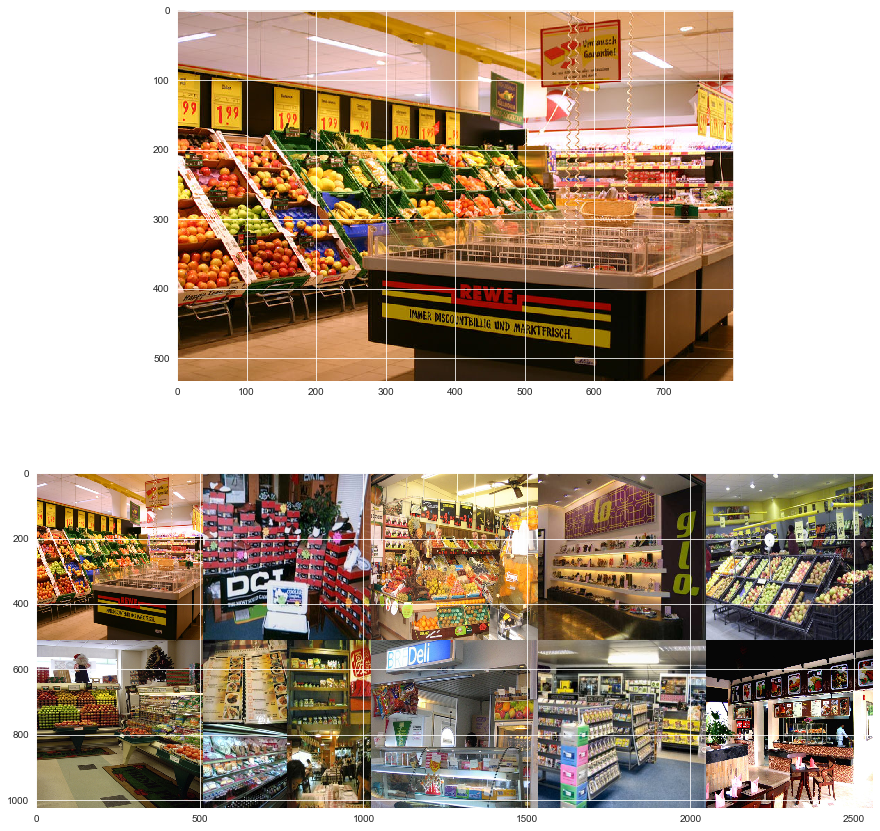

In [28]:
#plotting the resulting similar images and their indices

fig, ax = plt.subplots(nrows=2,figsize=(15,15))
query_idx = 734
MAX_RESULTS = 10
queryFeatures = feature_dict["features"][query_idx]
results = perform_search(queryFeatures, feature_dict, maxResults=MAX_RESULTS)
imgs = []

for (d,j) in results:
    img = np.array(Image.open(data_feature_df.iloc[j, 0]))
    print(j)
    imgs.append(img)

ax[0].imshow(np.array(Image.open(data_feature_df.iloc[query_idx, 0])))

montage = build_montages(imgs, (512,512), (5,2))[0]
ax[1].imshow(montage)
    

# KNN - sklearn

In [36]:
from sklearn.neighbors import NearestNeighbors

In [37]:
"""
    query_idx -- index of the query image
    queryFeatures -- storing the feature vector of the query image from the dictionary
    neighbors_count -- no. of images to be retrieved
    indices -- stores indices of the retrieved images
"""

query_idx = 734
queryFeatures = feature_dict["features"][query_idx]
neighbors_count = 10
nearest_neighbors = NearestNeighbors(n_neighbors=neighbors_count, metric='chebyshev').fit(feature_dict["features"])
_, indices = nearest_neighbors.kneighbors(queryFeatures.reshape(1,-1))

In [38]:
print(indices)

[[ 734 3199 2119 2152 1221  113  563 2300  477 1434]]


734
3199
2119
2152
1221
113
563
2300
477
1434


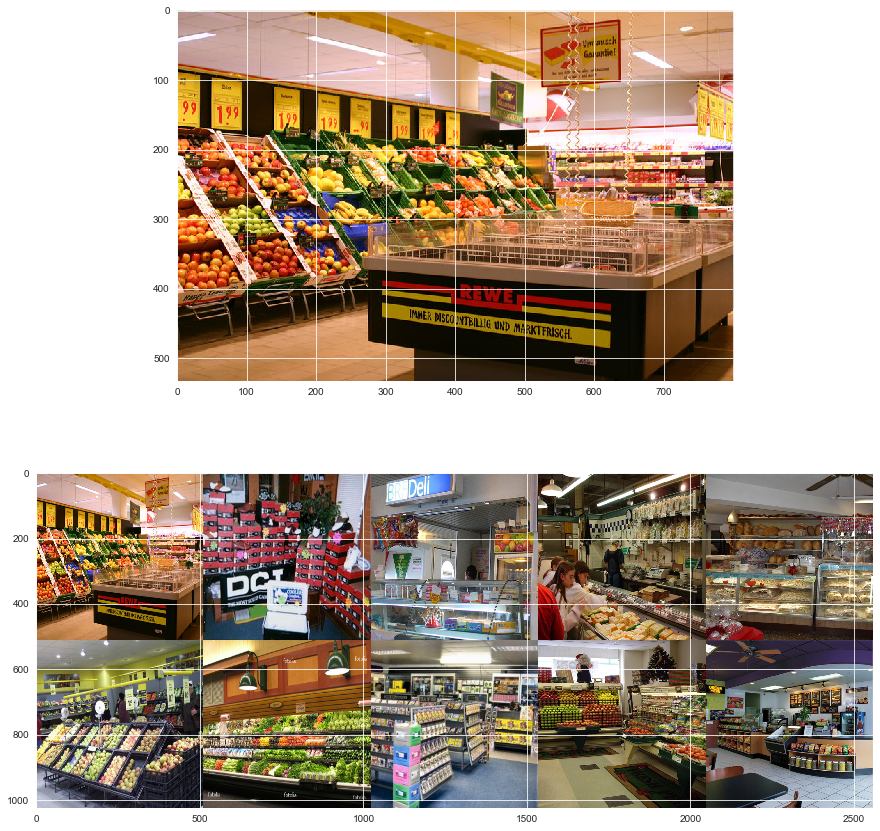

In [39]:
#plot resulting similar images

fig, ax = plt.subplots(nrows=2,figsize=(15,15))
query_idx = 734
MAX_RESULTS = 10
queryFeatures = feature_dict["features"][query_idx]
imgs = []

for j in indices[0]:
    img = np.array(Image.open(data_feature_df.iloc[j, 0]))
    print(j)
    imgs.append(img)

ax[0].imshow(np.array(Image.open(data_feature_df.iloc[query_idx, 0])))

montage = build_montages(imgs, (512,512), (5,2))[0]
ax[1].imshow(montage)

# KDTree

In [40]:
from sklearn.neighbors import KDTree

In [41]:
"""
    query_idx -- index of the query image
    queryFeatures -- storing the feature vector of the query image from the dictionary
    feat_dt -- converting feature list into array
    indices -- stores indices of the retrieved images
"""

query_idx = 734
queryFeatures = feature_dict["features"][query_idx]
feat_dt = np.array(feature_dict["features"])
kdt = KDTree(feat_dt, leaf_size=40)
_, indices = kdt.query(queryFeatures.reshape(1, -1), k=10)

In [42]:
print(indices)

[[ 734 3199  496  418  113  477 2112 2119 2300  506]]


734
3199
496
418
113
477
2112
2119
2300
506


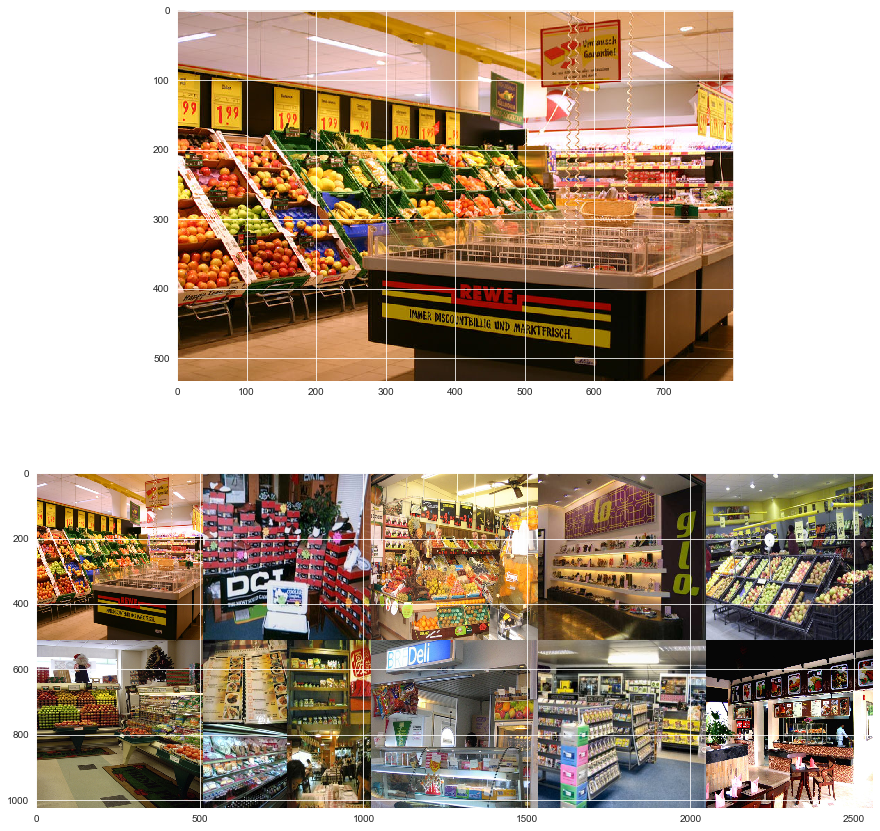

In [43]:
#plotting resulting similar images

fig, ax = plt.subplots(nrows=2,figsize=(15,15))
query_idx = 734
MAX_RESULTS = 10
queryFeatures = feature_dict["features"][query_idx]
imgs = []

for j in indices[0]:
    img = np.array(Image.open(data_feature_df.iloc[j, 0]))
    print(j)
    imgs.append(img)
        
ax[0].imshow(np.array(Image.open(data_feature_df.iloc[query_idx, 0])))

montage = build_montages(imgs, (512,512), (5,2))[0]
ax[1].imshow(montage)

# LSHashing

In [53]:
#from lshashpy3 import LSHash

In [54]:
## Locality Sensitive Hashing
# params
# k = 12 # hash size
# L = 5  # number of tables
# d = 14112 # Dimension of Feature vector
# lsh = LSHash(hash_size=k, input_dim=d, num_hashtables=L)

# # LSH on all the images
# for idx,vec in tqdm(feature_dict.items()):
#     lsh.index(vec.flatten(), extra_data=idx)

In [55]:
## Exporting as pickle
#pickle.dump(lsh, open('lsh.p', "wb"))

In [56]:
# def get_similar_item(idx, feature_dict, lsh_variable, n_items=10):
#     response = lsh_variable.query(feature_dict[list(feature_dict.keys())[idx]].flatten(), 
#                      num_results=n_items+1, distance_func='hamming')
    
#     imgs = []
#     for i in range(1, n_items+1):
#         imgs.append(np.array(Image.open(images[response[i][0][1]])))
#     return imgs

In [57]:
# fig, ax = plt.subplots(nrows=2,figsize=(15,15))
# queryIdx = 5

# ax[0].imshow(np.array(Image.open(images[queryIdx])))

# montage = build_montages(get_similar_item(queryIdx, feature_dict, lsh,10),(512, 512), (5, 2))[0]
# ax[1].imshow(montage)